# AFM tip + Si/SiGe FEniCSx run vs. Leah's reference VTK

Reuses `poisson.vtk_xdmf_compare` (same module/functions as
`vtk_xdmf_comparison copy.ipynb`) unmodified -- only the configuration
cell below is new, pointing it at `basePotential3d(1).vtk` and the
AFM-tip FEniCSx run instead of the sphere-benchmark cases.

In [1]:
import sys
from pathlib import Path

PROJECT_ROOT = Path.home() / "Desktop" / "poisson_solver"
sys.path.insert(0, str(PROJECT_ROOT / "src"))

from poisson.vtk_xdmf_compare import XdmfCase, run_comparison

%matplotlib inline

# AFM tip + Si/SiGe FEniCSx run vs. Leah's reference VTK

Reuses `poisson.vtk_xdmf_compare` (same module/functions as
`vtk_xdmf_comparison copy.ipynb`) unmodified -- only the configuration
cell below is new, pointing it at `basePotential3d(1).vtk` and the
AFM-tip FEniCSx run instead of the sphere-benchmark cases.

In [ ]:
import sys
from pathlib import Path

PROJECT_ROOT = Path.home() / "Desktop" / "poisson_solver"
sys.path.insert(0, str(PROJECT_ROOT / "src"))

from poisson.vtk_xdmf_compare import XdmfCase, run_comparison

%matplotlib inline

## Configuration

- `RUN_NUMBER`: which `notebooks/afm_vs_leah_compare/runN/` to compare --
  bump this each time `calibrate_afm_tip_vs_leah.py` produces a new run,
  re-run this notebook, and compare against the previous run's numbers.
- `vtk_path`: Leah's reference (`basePotential3d(1).vtk`, nm units,
  x,y in [-150,150], z in [0,2053]).
- `xdmf_cases`: the calibration run's combined XDMF, field `phi_V`,
  already in nm (no scale conversion -- this geometry script builds
  directly in nm).


In [ ]:
RUN_NUMBER = 3

vtk_path = Path.home() / "Downloads" / "basePotential3d(1).vtk"
run_dir = PROJECT_ROOT / "notebooks" / "afm_vs_leah_compare" / f"run{RUN_NUMBER}"
xdmf_path = run_dir / "sige_afm_tip.xdmf"

import json
run_meta = json.loads((run_dir / "run_results.json").read_text())
angle = run_meta["geometry_nm"]["cone_half_angle_deg_effective"]
tip_v = run_meta["voltages_V"]["AFM_tip"]
bottom_v = run_meta["voltages_V"]["bottom_back_gate"]
label = f"run{RUN_NUMBER} (angle={angle:.1f}deg, tip={tip_v}V, bottom={bottom_v}V)"

xdmf_cases = [
    XdmfCase(label, xdmf_path, field="phi_V", scale=1.0),
]

z_slices = [0.0, 2.0, 30.0, 35.0, 40.0, 43.0, 48.0, 53.0]

out_dir = PROJECT_ROOT / "notebooks" / "afm_vs_leah_compare" / f"run{RUN_NUMBER}" / "vs_leah_vtk"
out_dir.mkdir(parents=True, exist_ok=True)

# 1% of the VTK's own peak |phi| (~4.4V) -- percent error is meaningless
# near-zero, per this module's own documented rationale.
pct_mask_threshold = 0.044

print(f"Comparing {label}")


Comparing run3 (angle=34.5deg, tip=1.0V, bottom=-4.4V)


## Run the comparison

Reference 'basePotential3d(1).vtk': field='basePotential', 636291 points

--- case: run3 (angle=34.5deg, tip=1.0V, bottom=-4.4V) (sige_afm_tip.xdmf) ---


  global: rel_L2=3.9051e-01  mean%=1.72e+03  nearest_fallback=0.0%


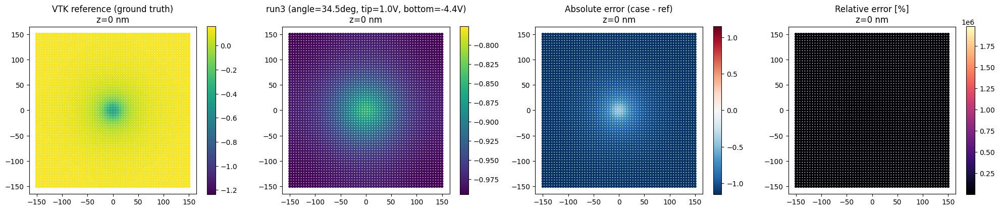

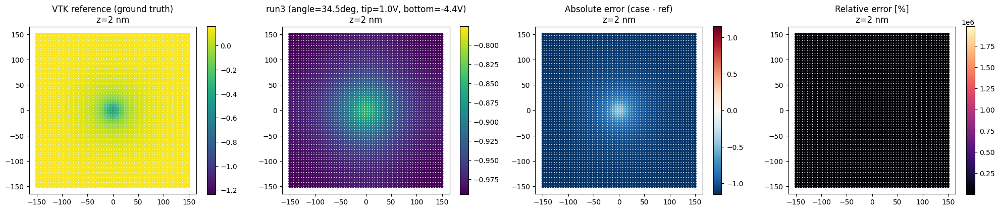

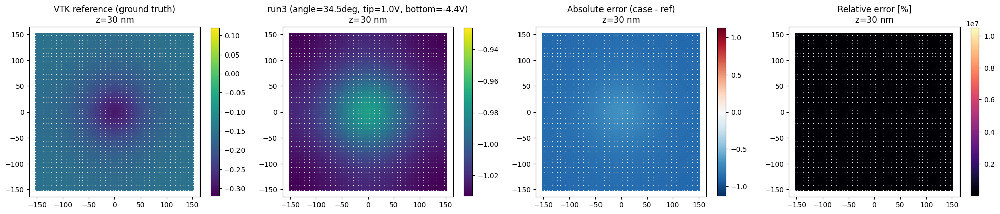

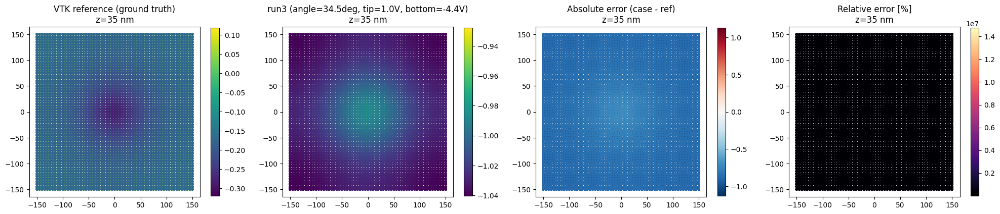

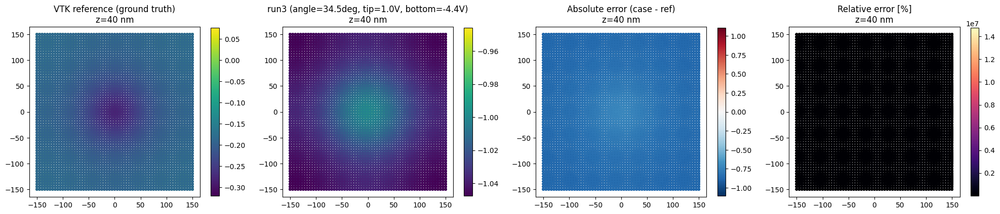

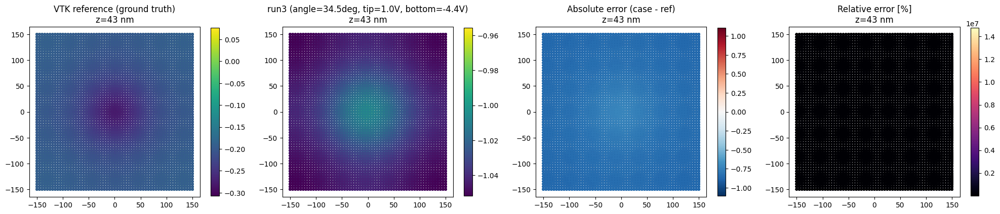

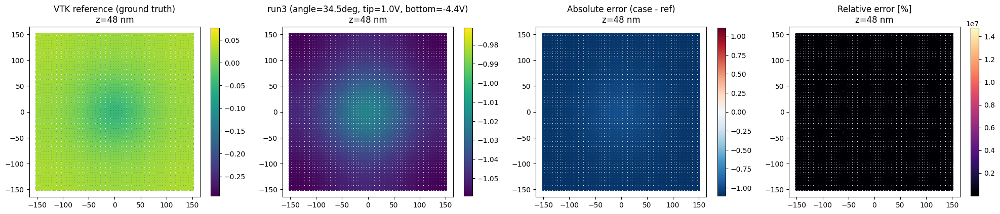

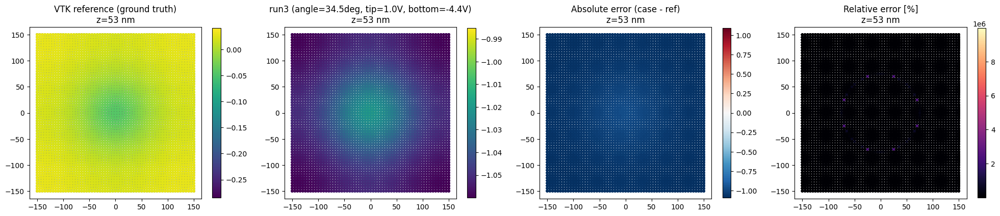

In [ ]:
metrics_df = run_comparison(
    vtk_path=vtk_path,
    cases=xdmf_cases,
    z_slices=z_slices,
    units=" nm",
    out_dir=out_dir,
    show_plots=True,
    pct_mask_threshold=pct_mask_threshold,
)

## Metrics table

One 'global' row plus one row per z-slice. `nearest_fallback_frac`
close to 1 means that slice barely overlaps the case domain.

In [ ]:
import pandas as pd
pd.set_option("display.width", 120)
metrics_df.sort_values(["case", "slice_z"], key=lambda c: c.astype(str))

,case,n_points,nearest_fallback_frac,abs_err_mean,abs_err_max,rel_l2_error,pct_err_mean,pct_err_median,pct_err_max,pct_err_mean_masked,pct_err_max_masked,n_points_above_threshold,slice_z
1,"run3 (angle=34.5deg, tip=1.0V, bottom=-4.4V)",11163,0.0,0.976694,1.154011,8.203781,3004.660466,1417.017178,1.979302e+06,1244.256736,2272.728496,9747,0.0
2,"run3 (angle=34.5deg, tip=1.0V, bottom=-4.4V)",11163,0.0,0.976694,1.154011,8.203781,3004.660466,1417.017178,1.979302e+06,1244.256736,2272.728496,9747,2.0
3,"run3 (angle=34.5deg, tip=1.0V, bottom=-4.4V)",111630,0.0,0.924504,1.132624,6.374820,2102.624381,587.854770,1.048212e+07,738.085135,2297.669252,105610,30.0
4,"run3 (angle=34.5deg, tip=1.0V, bottom=-4.4V)",145119,0.0,0.933733,1.131964,6.708968,2983.251309,605.096116,1.475405e+07,853.926621,2398.692064,134503,35.0
5,"run3 (angle=34.5deg, tip=1.0V, bottom=-4.4V)",145119,0.0,0.872962,1.110705,5.262676,1785.082610,509.203763,1.475405e+07,664.277914,2398.692064,140235,40.0
6,"run3 (angle=34.5deg, tip=1.0V, bottom=-4.4V)",145119,0.0,0.870777,1.110705,5.020791,1763.057599,472.860077,1.475405e+07,641.485833,2398.692064,140235,43.0
7,"run3 (angle=34.5deg, tip=1.0V, bottom=-4.4V)",145119,0.0,0.924509,1.110705,6.120931,4924.845907,496.793726,1.475405e+07,702.111203,2398.692064,106787,48.0
8,"run3 (angle=34.5deg, tip=1.0V, bottom=-4.4V)",111630,0.0,0.911453,1.093650,5.693286,5159.746362,465.754354,9.966051e+06,454.504330,2210.392575,74470,53.0
0,"run3 (angle=34.5deg, tip=1.0V, bottom=-4.4V)",636291,0.0,0.694564,1.154011,0.390509,1721.770271,138.440693,1.475405e+07,333.040637,2398.692064,583439,global


## Fine-grained full-depth z-sweep

The metrics table above only samples 8 hand-picked depths. Here we sweep
z at 1 nm resolution from the top surface (z=0) down through the device
(0-300 nm), then at 5 nm resolution through the deep buffer (300-2000 nm)
down to the VTK's max z -- about 600 slices total. The VTK reference is
read once, the XDMF case is read once, and the FEM field is interpolated
onto the VTK's own points once; each slice below just re-masks that single
interpolation result by z; recomputing the interpolation per-slice would
be redundant and slow. Results (min/mean/max of VTK phi, FEM phi, absolute
error, and relative error, per slice) are written to
`full_z_sweep_metrics.csv` in `out_dir` and shown inline below.

In [ ]:
import warnings

import numpy as np

from poisson.vtk_xdmf_compare import (
    EPS_FLOOR,
    interpolate_case_onto_ref,
    nearest_z_mask,
    read_vtk_reference,
    read_xdmf_case,
)

# --- Build the z-slice array: 0-300nm in 1nm steps, then 300-2000nm in 5nm steps ---
z_fine = np.arange(0.0, 300.0 + 1e-9, 1.0)
z_coarse = np.arange(300.0, 2000.0 + 1e-9, 5.0)
z_full_sweep = np.unique(np.concatenate([z_fine, z_coarse]))  # dedupes shared 300.0
print(f"Total z slices requested: {len(z_full_sweep)}")

# --- Read VTK reference + XDMF case once, interpolate once ---
sweep_case = xdmf_cases[0]
ref_full = read_vtk_reference(vtk_path)
case_full = read_xdmf_case(sweep_case)
result_full = interpolate_case_onto_ref(ref_full, case_full, sweep_case.label)

# --- Per-slice metrics ---
rows = []
n_skipped = 0
for i, z in enumerate(z_full_sweep, start=1):
    mask = nearest_z_mask(result_full.points, z)
    n_pts = int(mask.sum())
    if n_pts < 4:
        n_skipped += 1
        warnings.warn(f"slice {i} z={z:.3g} nm: only {n_pts} points, skipping")
        continue

    ref_v = result_full.ref_values[mask]
    case_v = result_full.case_values[mask]
    abs_err = case_v - ref_v
    denom = np.maximum(np.abs(ref_v), EPS_FLOOR)
    rel_err = np.abs(abs_err) / denom

    rows.append(
        {
            "slice_num": i,
            "z_nm": z,
            "n_points": n_pts,
            "vtk_phi_min": ref_v.min(),
            "vtk_phi_mean": ref_v.mean(),
            "vtk_phi_max": ref_v.max(),
            "fem_phi_min": case_v.min(),
            "fem_phi_mean": case_v.mean(),
            "fem_phi_max": case_v.max(),
            "abs_err_min": abs_err.min(),
            "abs_err_mean": abs_err.mean(),
            "abs_err_max": abs_err.max(),
            "rel_err_min": rel_err.min(),
            "rel_err_mean": rel_err.mean(),
            "rel_err_max": rel_err.max(),
        }
    )

full_sweep_df = pd.DataFrame(rows)
print(f"Slices kept: {len(full_sweep_df)}, skipped (<4 points): {n_skipped}")

csv_path = out_dir / "full_z_sweep_metrics.csv"
full_sweep_df.to_csv(csv_path, index=False)
print(f"Saved full z-sweep metrics to: {csv_path}")
print(f"Total rows: {len(full_sweep_df)}")

worst_row = full_sweep_df.loc[full_sweep_df["rel_err_mean"].idxmax()]
best_row = full_sweep_df.loc[full_sweep_df["rel_err_mean"].idxmin()]
print("\nWorst slice by mean relative error:")
print(worst_row)
print("\nBest slice by mean relative error:")
print(best_row)

pd.set_option("display.max_rows", None)
pd.set_option("display.width", 140)
full_sweep_df


Total z slices requested: 641


Slices kept: 641, skipped (<4 points): 0
Saved full z-sweep metrics to: /Users/angelramirez/Desktop/poisson_solver/notebooks/afm_vs_leah_compare/run3/vs_leah_vtk/full_z_sweep_metrics.csv
Total rows: 641

Worst slice by mean relative error:
slice_num          68.000000
z_nm               67.000000
n_points         7442.000000
vtk_phi_min        -0.045455
vtk_phi_mean        0.012594
vtk_phi_max         0.030347
fem_phi_min        -1.059909
fem_phi_mean       -1.047125
fem_phi_max        -1.020977
abs_err_min        -1.089522
abs_err_mean       -1.059719
abs_err_max        -0.975732
rel_err_min        21.487026
rel_err_mean      159.480670
rel_err_max     24428.809576
Name: 67, dtype: float64

Best slice by mean relative error:
slice_num        638.000000
z_nm            1985.000000
n_points        3721.000000
vtk_phi_min       -4.267652
vtk_phi_mean      -4.267651
vtk_phi_max       -4.267652
fem_phi_min       -4.299418
fem_phi_mean      -4.299418
fem_phi_max       -4.299418
abs_err_min 

,slice_num,z_nm,n_points,vtk_phi_min,vtk_phi_mean,vtk_phi_max,fem_phi_min,fem_phi_mean,fem_phi_max,abs_err_min,abs_err_mean,abs_err_max,rel_err_min,rel_err_mean,rel_err_max
0,1,0.0,11163,-1.235000,0.020130,0.159836,-0.994176,-0.955371,-0.775982,-1.154011,-0.975501,0.459018,0.022781,30.046605,19793.022581
1,2,1.0,11163,-1.235000,0.020130,0.159836,-0.994176,-0.955371,-0.775982,-1.154011,-0.975501,0.459018,0.022781,30.046605,19793.022581
2,3,2.0,11163,-1.235000,0.020130,0.159836,-0.994176,-0.955371,-0.775982,-1.154011,-0.975501,0.459018,0.022781,30.046605,19793.022581
3,4,3.0,11163,-1.235000,0.020130,0.159836,-0.994176,-0.955371,-0.775982,-1.154011,-0.975501,0.459018,0.022781,30.046605,19793.022581
4,5,4.0,11163,-1.235000,0.020130,0.159836,-0.994176,-0.955371,-0.775982,-1.154011,-0.975501,0.459018,0.022781,30.046605,19793.022581
5,6,5.0,11163,-1.235000,0.020130,0.159836,-0.994176,-0.955371,-0.775982,-1.154011,-0.975501,0.459018,0.022781,30.046605,19793.022581
6,7,6.0,11163,-1.235000,0.020130,0.159836,-0.994176,-0.955371,-0.775982,-1.154011,-0.975501,0.459018,0.022781,30.046605,19793.022581
7,8,7.0,11163,-1.235000,0.020130,0.159836,-0.994176,-0.955371,-0.775982,-1.154011,-0.975501,0.459018,0.022781,30.046605,19793.022581
8,9,8.0,14884,-1.235000,0.041979,0.159836,-1.003514,-0.961209,-0.775982,-1.154011,-1.003188,0.459018,0.022781,26.728321,19793.022581
9,10,9.0,14884,-1.235000,0.041979,0.159836,-1.003514,-0.961209,-0.775982,-1.154011,-1.003188,0.459018,0.022781,26.728321,19793.022581


## Configuration

- `RUN_NUMBER`: which `notebooks/afm_vs_leah_compare/runN/` to compare --
  bump this each time `calibrate_afm_tip_vs_leah.py` produces a new run,
  re-run this notebook, and compare against the previous run's numbers.
- `vtk_path`: Leah's reference (`basePotential3d(1).vtk`, nm units,
  x,y in [-150,150], z in [0,2053]).
- `xdmf_cases`: the calibration run's combined XDMF, field `phi_V`,
  already in nm (no scale conversion -- this geometry script builds
  directly in nm).


In [2]:
RUN_NUMBER = 3

vtk_path = Path.home() / "Downloads" / "basePotential3d(1).vtk"
run_dir = PROJECT_ROOT / "notebooks" / "afm_vs_leah_compare" / f"run{RUN_NUMBER}"
xdmf_path = run_dir / "sige_afm_tip.xdmf"

import json
run_meta = json.loads((run_dir / "run_results.json").read_text())
angle = run_meta["geometry_nm"]["cone_half_angle_deg_effective"]
tip_v = run_meta["voltages_V"]["AFM_tip"]
bottom_v = run_meta["voltages_V"]["bottom_back_gate"]
label = f"run{RUN_NUMBER} (angle={angle:.1f}deg, tip={tip_v}V, bottom={bottom_v}V)"

xdmf_cases = [
    XdmfCase(label, xdmf_path, field="phi_V", scale=1.0),
]

z_slices = [0.0, 2.0, 30.0, 35.0, 40.0, 43.0, 48.0, 53.0]

out_dir = PROJECT_ROOT / "notebooks" / "afm_vs_leah_compare" / f"run{RUN_NUMBER}" / "vs_leah_vtk"
out_dir.mkdir(parents=True, exist_ok=True)

# 1% of the VTK's own peak |phi| (~4.4V) -- percent error is meaningless
# near-zero, per this module's own documented rationale.
pct_mask_threshold = 0.044

print(f"Comparing {label}")


Comparing run3 (angle=34.5deg, tip=1.0V, bottom=-4.4V)


## Run the comparison

Reference 'basePotential3d(1).vtk': field='basePotential', 636291 points

--- case: run3 (angle=34.5deg, tip=1.0V, bottom=-4.4V) (sige_afm_tip.xdmf) ---


  global: rel_L2=3.9051e-01  mean%=1.72e+03  nearest_fallback=0.0%


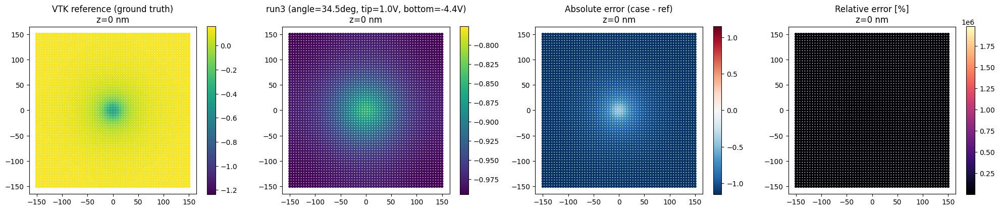

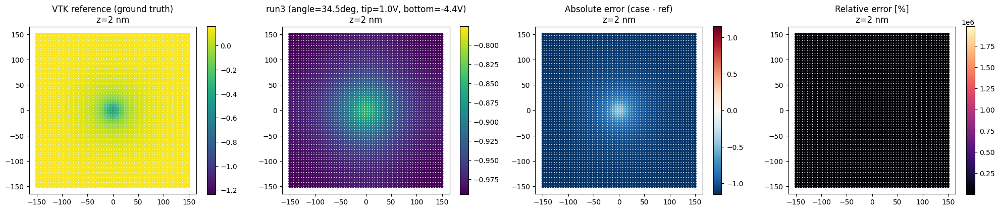

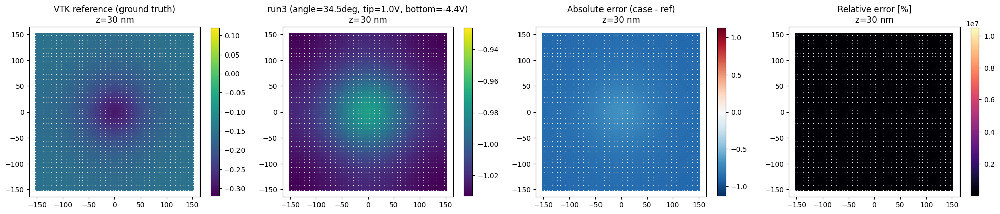

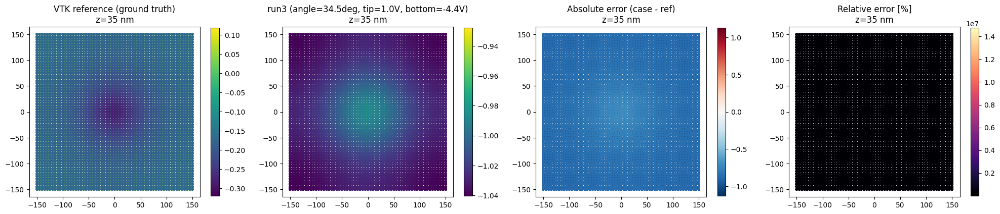

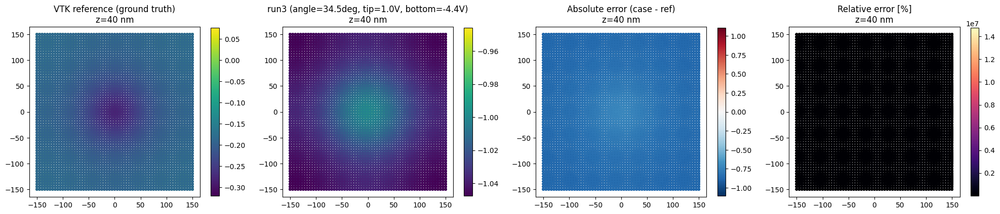

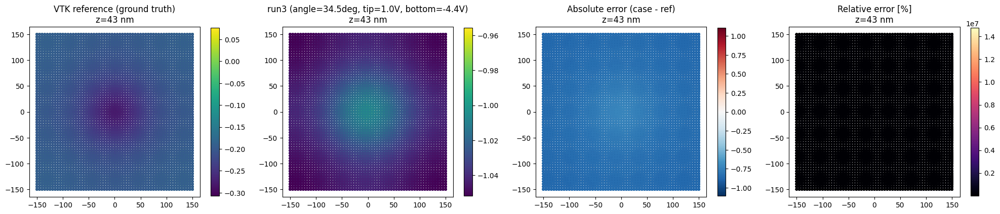

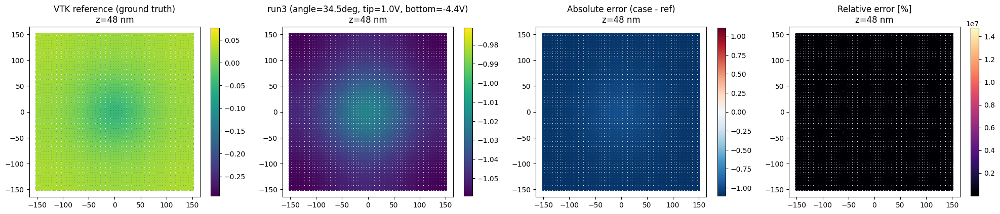

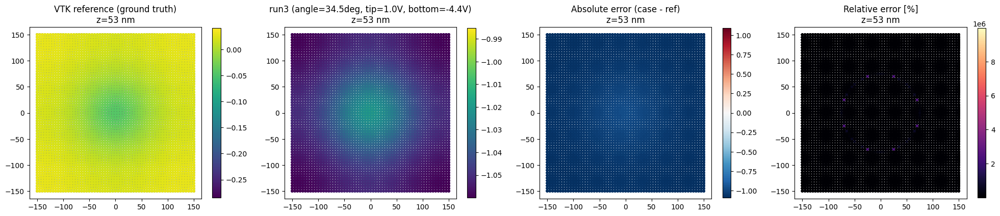

In [3]:
metrics_df = run_comparison(
    vtk_path=vtk_path,
    cases=xdmf_cases,
    z_slices=z_slices,
    units=" nm",
    out_dir=out_dir,
    show_plots=True,
    pct_mask_threshold=pct_mask_threshold,
)

## Metrics table

One 'global' row plus one row per z-slice. `nearest_fallback_frac`
close to 1 means that slice barely overlaps the case domain.

In [4]:
import pandas as pd
pd.set_option("display.width", 120)
metrics_df.sort_values(["case", "slice_z"], key=lambda c: c.astype(str))

,case,n_points,nearest_fallback_frac,abs_err_mean,abs_err_max,rel_l2_error,pct_err_mean,pct_err_median,pct_err_max,pct_err_mean_masked,pct_err_max_masked,n_points_above_threshold,slice_z
1,"run3 (angle=34.5deg, tip=1.0V, bottom=-4.4V)",11163,0.0,0.976694,1.154011,8.203781,3004.660466,1417.017178,1.979302e+06,1244.256736,2272.728496,9747,0.0
2,"run3 (angle=34.5deg, tip=1.0V, bottom=-4.4V)",11163,0.0,0.976694,1.154011,8.203781,3004.660466,1417.017178,1.979302e+06,1244.256736,2272.728496,9747,2.0
3,"run3 (angle=34.5deg, tip=1.0V, bottom=-4.4V)",111630,0.0,0.924504,1.132624,6.374820,2102.624381,587.854770,1.048212e+07,738.085135,2297.669252,105610,30.0
4,"run3 (angle=34.5deg, tip=1.0V, bottom=-4.4V)",145119,0.0,0.933733,1.131964,6.708968,2983.251309,605.096116,1.475405e+07,853.926621,2398.692064,134503,35.0
5,"run3 (angle=34.5deg, tip=1.0V, bottom=-4.4V)",145119,0.0,0.872962,1.110705,5.262676,1785.082610,509.203763,1.475405e+07,664.277914,2398.692064,140235,40.0
6,"run3 (angle=34.5deg, tip=1.0V, bottom=-4.4V)",145119,0.0,0.870777,1.110705,5.020791,1763.057599,472.860077,1.475405e+07,641.485833,2398.692064,140235,43.0
7,"run3 (angle=34.5deg, tip=1.0V, bottom=-4.4V)",145119,0.0,0.924509,1.110705,6.120931,4924.845907,496.793726,1.475405e+07,702.111203,2398.692064,106787,48.0
8,"run3 (angle=34.5deg, tip=1.0V, bottom=-4.4V)",111630,0.0,0.911453,1.093650,5.693286,5159.746362,465.754354,9.966051e+06,454.504330,2210.392575,74470,53.0
0,"run3 (angle=34.5deg, tip=1.0V, bottom=-4.4V)",636291,0.0,0.694564,1.154011,0.390509,1721.770271,138.440693,1.475405e+07,333.040637,2398.692064,583439,global


## Fine-grained full-depth z-sweep

The metrics table above only samples 8 hand-picked depths. Here we sweep
z at 1 nm resolution from the top surface (z=0) down through the device
(0-300 nm), then at 5 nm resolution through the deep buffer (300-2000 nm)
down to the VTK's max z -- about 600 slices total. The VTK reference is
read once, the XDMF case is read once, and the FEM field is interpolated
onto the VTK's own points once; each slice below just re-masks that single
interpolation result by z; recomputing the interpolation per-slice would
be redundant and slow. Results (min/mean/max of VTK phi, FEM phi, absolute
error, and relative error, per slice) are written to
`full_z_sweep_metrics.csv` in `out_dir` and shown inline below.

In [5]:
import warnings

import numpy as np

from poisson.vtk_xdmf_compare import (
    EPS_FLOOR,
    interpolate_case_onto_ref,
    nearest_z_mask,
    read_vtk_reference,
    read_xdmf_case,
)

# --- Build the z-slice array: 0-300nm in 1nm steps, then 300-2000nm in 5nm steps ---
z_fine = np.arange(0.0, 300.0 + 1e-9, 1.0)
z_coarse = np.arange(300.0, 2000.0 + 1e-9, 5.0)
z_full_sweep = np.unique(np.concatenate([z_fine, z_coarse]))  # dedupes shared 300.0
print(f"Total z slices requested: {len(z_full_sweep)}")

# --- Read VTK reference + XDMF case once, interpolate once ---
sweep_case = xdmf_cases[0]
ref_full = read_vtk_reference(vtk_path)
case_full = read_xdmf_case(sweep_case)
result_full = interpolate_case_onto_ref(ref_full, case_full, sweep_case.label)

# --- Per-slice metrics ---
rows = []
n_skipped = 0
for i, z in enumerate(z_full_sweep, start=1):
    mask = nearest_z_mask(result_full.points, z)
    n_pts = int(mask.sum())
    if n_pts < 4:
        n_skipped += 1
        warnings.warn(f"slice {i} z={z:.3g} nm: only {n_pts} points, skipping")
        continue

    ref_v = result_full.ref_values[mask]
    case_v = result_full.case_values[mask]
    abs_err = case_v - ref_v
    denom = np.maximum(np.abs(ref_v), EPS_FLOOR)
    rel_err = np.abs(abs_err) / denom

    rows.append(
        {
            "slice_num": i,
            "z_nm": z,
            "n_points": n_pts,
            "vtk_phi_min": ref_v.min(),
            "vtk_phi_mean": ref_v.mean(),
            "vtk_phi_max": ref_v.max(),
            "fem_phi_min": case_v.min(),
            "fem_phi_mean": case_v.mean(),
            "fem_phi_max": case_v.max(),
            "abs_err_min": abs_err.min(),
            "abs_err_mean": abs_err.mean(),
            "abs_err_max": abs_err.max(),
            "rel_err_min": rel_err.min(),
            "rel_err_mean": rel_err.mean(),
            "rel_err_max": rel_err.max(),
        }
    )

full_sweep_df = pd.DataFrame(rows)
print(f"Slices kept: {len(full_sweep_df)}, skipped (<4 points): {n_skipped}")

csv_path = out_dir / "full_z_sweep_metrics.csv"
full_sweep_df.to_csv(csv_path, index=False)
print(f"Saved full z-sweep metrics to: {csv_path}")
print(f"Total rows: {len(full_sweep_df)}")

worst_row = full_sweep_df.loc[full_sweep_df["rel_err_mean"].idxmax()]
best_row = full_sweep_df.loc[full_sweep_df["rel_err_mean"].idxmin()]
print("\nWorst slice by mean relative error:")
print(worst_row)
print("\nBest slice by mean relative error:")
print(best_row)

pd.set_option("display.max_rows", None)
pd.set_option("display.width", 140)
full_sweep_df


Total z slices requested: 641


Slices kept: 641, skipped (<4 points): 0
Saved full z-sweep metrics to: /Users/angelramirez/Desktop/poisson_solver/notebooks/afm_vs_leah_compare/run3/vs_leah_vtk/full_z_sweep_metrics.csv
Total rows: 641

Worst slice by mean relative error:
slice_num          68.000000
z_nm               67.000000
n_points         7442.000000
vtk_phi_min        -0.045455
vtk_phi_mean        0.012594
vtk_phi_max         0.030347
fem_phi_min        -1.059909
fem_phi_mean       -1.047125
fem_phi_max        -1.020977
abs_err_min        -1.089522
abs_err_mean       -1.059719
abs_err_max        -0.975732
rel_err_min        21.487026
rel_err_mean      159.480670
rel_err_max     24428.809576
Name: 67, dtype: float64

Best slice by mean relative error:
slice_num        638.000000
z_nm            1985.000000
n_points        3721.000000
vtk_phi_min       -4.267652
vtk_phi_mean      -4.267651
vtk_phi_max       -4.267652
fem_phi_min       -4.299418
fem_phi_mean      -4.299418
fem_phi_max       -4.299418
abs_err_min 

,slice_num,z_nm,n_points,vtk_phi_min,vtk_phi_mean,vtk_phi_max,fem_phi_min,fem_phi_mean,fem_phi_max,abs_err_min,abs_err_mean,abs_err_max,rel_err_min,rel_err_mean,rel_err_max
0,1,0.0,11163,-1.235000,0.020130,0.159836,-0.994176,-0.955371,-0.775982,-1.154011,-0.975501,0.459018,0.022781,30.046605,19793.022581
1,2,1.0,11163,-1.235000,0.020130,0.159836,-0.994176,-0.955371,-0.775982,-1.154011,-0.975501,0.459018,0.022781,30.046605,19793.022581
2,3,2.0,11163,-1.235000,0.020130,0.159836,-0.994176,-0.955371,-0.775982,-1.154011,-0.975501,0.459018,0.022781,30.046605,19793.022581
3,4,3.0,11163,-1.235000,0.020130,0.159836,-0.994176,-0.955371,-0.775982,-1.154011,-0.975501,0.459018,0.022781,30.046605,19793.022581
4,5,4.0,11163,-1.235000,0.020130,0.159836,-0.994176,-0.955371,-0.775982,-1.154011,-0.975501,0.459018,0.022781,30.046605,19793.022581
5,6,5.0,11163,-1.235000,0.020130,0.159836,-0.994176,-0.955371,-0.775982,-1.154011,-0.975501,0.459018,0.022781,30.046605,19793.022581
6,7,6.0,11163,-1.235000,0.020130,0.159836,-0.994176,-0.955371,-0.775982,-1.154011,-0.975501,0.459018,0.022781,30.046605,19793.022581
7,8,7.0,11163,-1.235000,0.020130,0.159836,-0.994176,-0.955371,-0.775982,-1.154011,-0.975501,0.459018,0.022781,30.046605,19793.022581
8,9,8.0,14884,-1.235000,0.041979,0.159836,-1.003514,-0.961209,-0.775982,-1.154011,-1.003188,0.459018,0.022781,26.728321,19793.022581
9,10,9.0,14884,-1.235000,0.041979,0.159836,-1.003514,-0.961209,-0.775982,-1.154011,-1.003188,0.459018,0.022781,26.728321,19793.022581


---
# Corrected, validated diagnostic analysis (run3)

Everything above this point is the ORIGINAL comparison workflow (`poisson.vtk_xdmf_compare`'s
`run_comparison`), preserved as-is. Everything below is a separate, more careful pass built by
a multi-agent audit, using the same underlying module functions
(`read_vtk_reference`/`read_xdmf_case`/`interpolate_case_onto_ref`/`nearest_z_mask`) but with
corrected/expanded error metrics, explicit fallback-fraction tracking, and a shape-vs-bias
decomposition. Full evidence trail: `notebooks/afm_vs_leah_compare/run3/diagnostics/`.

**Do not skip this section's caveats.** The single most important finding of this whole
analysis is in the "Open question" cell at the end -- read it before trusting any single
number above.

In [6]:
import json
import pandas as pd
from pathlib import Path

diag_dir = run_dir / "diagnostics"
metrics_dir = run_dir / "metrics"
plots_dir = run_dir / "plots"

depth_df = pd.read_csv(metrics_dir / "depth_metrics_corrected.csv")
with open(metrics_dir / "summary_metrics_corrected.json") as f:
    summary = json.load(f)

print(f"Loaded {len(depth_df)} corrected depth-metric rows from {metrics_dir/'depth_metrics_corrected.csv'}")
print(f"Columns: {list(depth_df.columns)}")

Loaded 641 corrected depth-metric rows from /Users/angelramirez/Desktop/poisson_solver/notebooks/afm_vs_leah_compare/run3/metrics/depth_metrics_corrected.csv
Columns: ['slice_num', 'is_special_z0', 'z_requested_nm', 'z_actual_nm', 'n_vtk_points', 'n_overlap', 'valid_overlap_frac', 'nearest_fallback_frac', 'n_excluded', 'vtk_min', 'vtk_mean', 'vtk_max', 'vtk_range', 'vtk_std', 'fem_min', 'fem_mean', 'fem_max', 'fem_range', 'fem_std', 'signed_err_min', 'signed_err_mean', 'signed_err_max', 'abs_err_min', 'abs_err_mean', 'abs_err_max', 'rmse', 'E_L2', 'E_range', 'masked_relerr_min', 'masked_relerr_mean', 'masked_relerr_max', 'n_masked_included', 'n_masked_excluded', 'shape_rmse', 'shape_rel_l2', 'pearson_r', 'fwhm_vtk_nm', 'fwhm_fem_nm', 'fwhm_diff_nm', 'peak_x_vtk', 'peak_y_vtk', 'peak_x_fem', 'peak_y_fem', 'peak_loc_dx', 'peak_loc_dy', 'peak_loc_dist', 'pp_amp_vtk', 'pp_amp_fem', 'pp_amp_diff']


## Corrected metrics: concise summary (full table is in the CSV, not dumped here)

Signed error (`FEM - VTK`, measures bias/direction) and absolute error are reported
SEPARATELY -- never conflate them. `E_L2` (relative L2) and `E_range` (RMSE normalized by
the VTK's own global voltage range) are the PRIMARY metrics for judging the <1% target.
The masked pointwise relative error (`|VTK| >= 0.044V` floor) is SECONDARY -- it's included
for completeness but must not be used alone to judge agreement, since it's noisy/unstable
wherever VTK crosses near zero.

In [7]:
pd.set_option("display.width", 140)
pd.set_option("display.max_columns", 12)

device = depth_df[(depth_df.z_actual_nm >= 0) & (depth_df.z_actual_nm <= 53)]
print(f"Global E_L2 = {summary['global_full_domain']['E_L2']:.4f}   Global E_range = {summary['global_full_domain']['E_range']:.4f}")
print()
print("Device region (z=0-53nm) summary stats across all slices in that range:")
print(device[["signed_err_mean", "abs_err_mean", "E_L2", "E_range",
              "masked_relerr_mean", "shape_rmse", "pearson_r",
              "valid_overlap_frac", "nearest_fallback_frac"]].describe().loc[["mean","min","max"]])

Global E_L2 = 0.3905   Global E_range = 0.1676

Device region (z=0-53nm) summary stats across all slices in that range:
      signed_err_mean  abs_err_mean       E_L2   E_range  masked_relerr_mean  shape_rmse  pearson_r  valid_overlap_frac  \
mean        -0.975708      0.975858   8.578381  0.214455            9.382816    0.060271  -0.939612                 1.0   
min         -1.090570      0.828048   3.941235  0.181706            3.993741    0.028134  -0.982971                 1.0   
max         -0.828048      1.090570  19.238127  0.239890           17.880128    0.122656  -0.786042                 1.0   

      nearest_fallback_frac  
mean                    0.0  
min                     0.0  
max                     0.0  


## Best and worst device-region slices -- vs. the TRIVIAL best slice

The single best-agreeing slice in the ENTIRE sweep sits deep in the inert SiGe buffer, right
next to the shared -4.4V grounded bottom boundary. That agreement is trivial: both solutions
are forced to that exact value there by construction (it's a shared Dirichlet BC), and by
z>100nm both fields go laterally flat, so there's no real spatial structure left to disagree
about. **It is not evidence of geometry or voltage correctness anywhere physically
interesting.** The numbers that actually matter are the device-region (z=0-53nm) ones.

In [8]:
trivial_best = depth_df.loc[depth_df["E_range"].idxmin()]
device_best = device.loc[device["E_range"].idxmin()]
device_worst = device.loc[device["E_range"].idxmax()]

print("TRIVIAL best slice (near shared -4.4V boundary, NOT physically meaningful):")
print(f"  z={trivial_best.z_actual_nm:.1f}nm  E_range={trivial_best.E_range:.4f}  "
      f"vtk_mean={trivial_best.vtk_mean:.3f}V  fem_mean={trivial_best.fem_mean:.3f}V")
print()
print("Device-region (0-53nm) BEST slice:")
print(f"  z={device_best.z_actual_nm:.1f}nm  E_range={device_best.E_range:.4f}  "
      f"signed_err_mean={device_best.signed_err_mean:.3f}V  pearson_r={device_best.pearson_r:.3f}")
print()
print("Device-region (0-53nm) WORST slice:")
print(f"  z={device_worst.z_actual_nm:.1f}nm  E_range={device_worst.E_range:.4f}  "
      f"signed_err_mean={device_worst.signed_err_mean:.3f}V  pearson_r={device_worst.pearson_r:.3f}")
print()
print(f"Both device-region slices are >20x worse (by E_range) than the trivial boundary slice --")
print(f"this is the gap between 'looks close because of a shared trivial BC' and 'actually agrees'.")

TRIVIAL best slice (near shared -4.4V boundary, NOT physically meaningful):
  z=1993.2nm  E_range=0.0070  vtk_mean=-4.268V  fem_mean=-4.299V

Device-region (0-53nm) BEST slice:
  z=52.0nm  E_range=0.1817  signed_err_mean=-0.828V  pearson_r=-0.983

Device-region (0-53nm) WORST slice:
  z=9.7nm  E_range=0.2399  signed_err_mean=-1.091V  pearson_r=-0.907

Both device-region slices are >20x worse (by E_range) than the trivial boundary slice --
this is the gap between 'looks close because of a shared trivial BC' and 'actually agrees'.


## Representative XY / XZ / YZ comparisons

Generated by a separate visualization pass (`scripts/comparison_visualizations.py`), saved as
PNGs -- displayed here, not regenerated (this notebook only loads/reports, per lead-agent
coordination rules). Full-range AND device-zoomed versions exist for xz/yz since the ~4.4V
deep-substrate swing otherwise hides the much smaller near-device differences.

XY plane at z=35nm (Si well, Leah's own stated comparison depth):


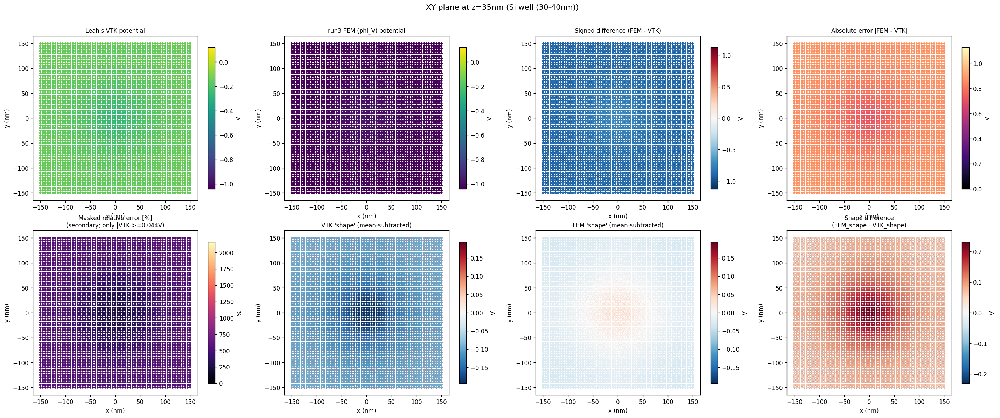

In [9]:
from IPython.display import Image, display

print("XY plane at z=35nm (Si well, Leah's own stated comparison depth):")
display(Image(filename=str(plots_dir / "representative_xy" / "xy_8panel_z35_well.png")))

XZ cross-section at y=0, device-region zoomed (z in [0,100]nm):


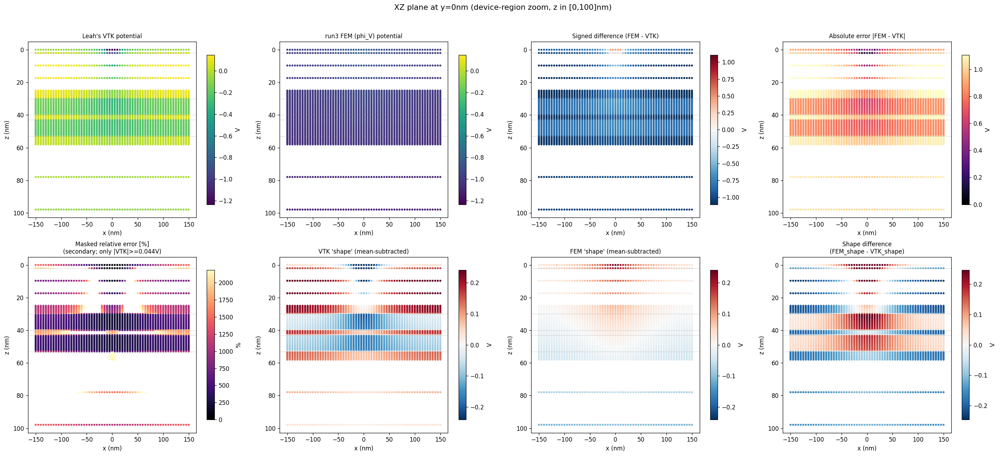

In [10]:
print("XZ cross-section at y=0, device-region zoomed (z in [0,100]nm):")
xz_zoom_candidates = sorted((plots_dir / "representative_xz").glob("*zoom*"))
if xz_zoom_candidates:
    display(Image(filename=str(xz_zoom_candidates[0])))
else:
    print("(file not found under representative_xz/ -- check plots_dir listing)")
    print(sorted((plots_dir / "representative_xz").glob("*")))

YZ cross-section at x=0, device-region zoomed (z in [0,100]nm):


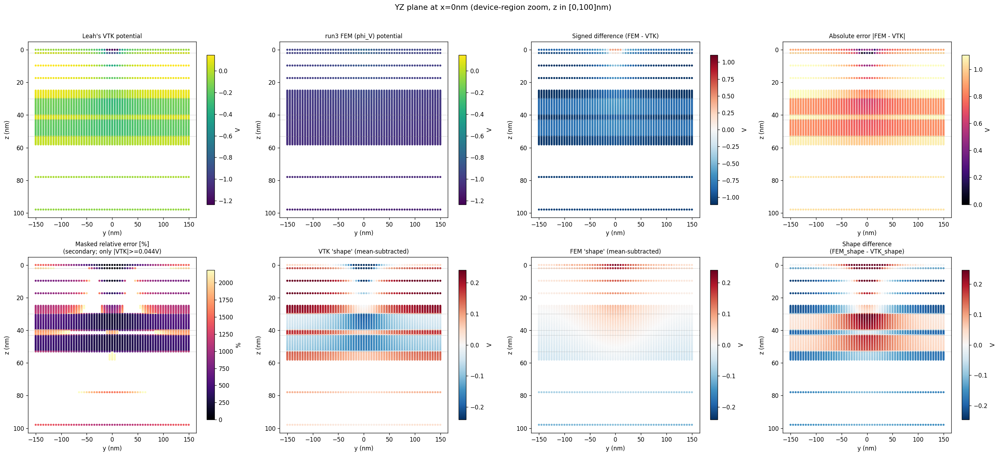

In [11]:
print("YZ cross-section at x=0, device-region zoomed (z in [0,100]nm):")
yz_zoom_candidates = sorted((plots_dir / "representative_yz").glob("*zoom*"))
if yz_zoom_candidates:
    display(Image(filename=str(yz_zoom_candidates[0])))
else:
    print("(file not found under representative_yz/ -- check plots_dir listing)")
    print(sorted((plots_dir / "representative_yz").glob("*")))

## Voltage-basis fit (run3 vs. a zero-tip companion run, run4)

Since this is a linear (Laplace) problem, `phi(V) = phi(V=0) + V * (phi(V=1) - phi(V=0))`
exactly, for fixed geometry/mesh/bottom-voltage. A zero-tip companion run (`run4`, identical
to `run3` except `--tip-voltage 0.0`) lets us solve for the least-squares optimal tip voltage
directly, rather than guessing.

In [12]:
with open(diag_dir / "voltage_basis_fit_results.json") as f:
    fit = json.load(f)

print(f"Best-fit tip voltage (device region, z=0-53nm): V* = {fit['v_star_device_region']:.3f} V")
print(f"Stability across depth windows: {fit['v_star_windows']}")
print()
b, a = fit["before_device_region"], fit["after_device_region"]
print(f"Device-region E_range:  before={b['E_range']:.4f}  after={a['E_range']:.4f}  "
      f"({b['E_range']/a['E_range']:.1f}x improvement)")
print(f"Device-region bias (mean signed err): before={b['bias_mean_signed_err_V']:.3f}V  "
      f"after={a['bias_mean_signed_err_V']:.6f}V")
print(f"Device-region shape correlation: before={b['pearson_r']:.4f}  after={a['pearson_r']:.4f}  "
      f"(UNCHANGED -- voltage fitting cannot touch shape/correlation, by construction)")
print()
bz, az = fit["before_z35"], fit["after_z35_devicefit"]
print(f"At z=35nm specifically: pearson_r before={bz['pearson_r']:.4f}  after={az['pearson_r']:.4f}")
print("-> Still strongly NEGATIVE after the best possible voltage fit. This is not a tuning")
print("   failure -- it was proven structurally: the zero-tip and V=1 fields are perfectly")
print("   collinear in-plane at fixed depth (corr=1.0000 between them), so ANY voltage-only")
print("   combination is mathematically forced to preserve whatever correlation-with-VTK it")
print("   already has. No tip voltage, positive or negative, can fix this shape mismatch.")

Best-fit tip voltage (device region, z=0-53nm): V* = 2.456 V
Stability across depth windows: {'z_0_20': 2.573528275398113, 'z_20_53': 2.4479440315148597, 'z_35_slice': 2.3376230065236907, 'z_48_slice': 2.3317758023846307, 'z_0_slice': 2.3411244677462992, 'z_9p67_slice': 2.7138329402352923}

Device-region E_range:  before=0.2021  after=0.0257  (7.9x improvement)
Device-region bias (mean signed err): before=-0.914V  after=0.000031V
Device-region shape correlation: before=0.2912  after=0.2912  (UNCHANGED -- voltage fitting cannot touch shape/correlation, by construction)

At z=35nm specifically: pearson_r before=-0.9696  after=-0.9696
-> Still strongly NEGATIVE after the best possible voltage fit. This is not a tuning
   failure -- it was proven structurally: the zero-tip and V=1 fields are perfectly
   collinear in-plane at fixed depth (corr=1.0000 between them), so ANY voltage-only
   combination is mathematically forced to preserve whatever correlation-with-VTK it
   already has. No ti

## Open question this analysis could not resolve

**It remains unconfirmed whether `basePotential3d(1).vtk` includes an AFM tip contribution at
all.** This MaSQE collaboration has a documented naming convention elsewhere in this repo
where `basePotential` = "background, no perturbing element active" (see
`diagnostics/physical_case_audit.md`) -- which would mean no amount of tip voltage or geometry
calibration against this file could ever succeed, because the file may contain zero tip
contribution.

Evidence from this pass is genuinely mixed:
- **For tip inclusion**: a single, physically reasonable, DEPTH-STABLE voltage (V*≈+2.46V,
  varying only 2.33-2.71V across six independent depth windows) reduces device-region error
  by 8x and zeroes the mean bias. A pure noise/no-tip file would not be expected to fit this
  cleanly.
- **Against (or at least, incompletely explained by) tip inclusion**: even at the best-fit
  voltage, the lateral SHAPE at z=35nm stays inverted (VTK shows a dip at the origin, FEM
  shows a bump) -- proven unfixable by voltage alone via the collinearity argument above.
  Either the VTK's feature isn't from a tip like ours, or our tip's geometry/polarity model
  is fundamentally wrong in a way voltage can't compensate for.

**Recommended next step, in order**: (1) resolve the basePotential-vs-totalPotential naming
question with Leah directly -- this is the highest-leverage single question remaining; (2) if
confirmed tip-included, run a confirmatory negative-tip-voltage solve as a cheap next
diagnostic, since the shape inversion is consistent with an opposite-polarity or
differently-shaped tip; (3) do not resume a geometry parameter sweep before either of those,
per the original task's explicit gating -- it would not be a controlled experiment against an
unconfirmed target.